<a href="https://colab.research.google.com/github/thiakx/ModernRecSys/blob/master/Modeling_Temporal_Fashion_Recommender_across_Season.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Welcome to this intro notebook on Modeling Temporal Fashion Recommender across Season

For this notebook, we will walk through the steps needed build Season Collection:
1.   Convert images to embeddings
2.   Conduct Transfer Learning from ResNet
3.   Use Fastai hooks to retrieve image embeddings from step 2
4.   Use Approximate Nearest Neighbors and embeddings centroid detection to obtain most similar images based on the embeddings from step 3.
5.   Combine the collections with weights 

Results: We can merge seasonal collections based on weights



# Initial Setup

In [0]:
# #reference: 
# #https://forums.fast.ai/t/how-to-find-similar-images-based-on-final-embedding-layer/16903

# # install fastai for the hook and annoy for approximate nearest neighbors 
!pip install fastai
!pip install annoy
!pip install gdown

     |████████████████████████████████| 645kB 3.4MB/s 
  Created wheel for annoy: filename=annoy-1.16.3-cp36-cp36m-linux_x86_64.whl size=297333 sha256=2f68c2d13f6e79cf3495310a13e5f63d7045930078c11ac04e8923b161d94744
  Stored in directory: /root/.cache/pip/wheels/f3/01/54/6ef760fe9f9fc6ba8c19cebbe6358212b5f3b5b0195c0b813f
Successfully built annoy


In [0]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import gdown
from fastai.vision import *
from fastai.metrics import accuracy, top_k_accuracy
from annoy import AnnoyIndex
import zipfile
import time
from google.colab import drive
%matplotlib inline


In [0]:
train_on_gpu = torch.cuda.is_available()
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ... To use GPU, go under edit > notebook settings')
else:
    print('CUDA is available!  Training on GPU ...')
    print(gpu_info)

CUDA is available!  Training on GPU ...
Sun Apr  5 12:30:33 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.64.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    27W / 250W |     10MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                    

## Get DeepFashion Data

DeepFashion data set: http://mmlab.ie.cuhk.edu.hk/projects/DeepFashion.html

We are using v1 of the data, with 24K+ images. 

In [0]:
# get the meta data
url = 'https://drive.google.com/uc?id=1d1nWNVHdIAvzuGyaSrajuPIffQTjbnsp'
output = 'list_category_cloth.txt'
gdown.download(url, output, quiet=False)

url = 'https://drive.google.com/uc?id=1quO7Fck8MsKum4lzeyMSbbSbL6yGAIDJ'
output = 'list_category_img.txt'
gdown.download(url, output, quiet=False)

url = 'https://drive.google.com/uc?id=1_rg5_UZ-ZXkcg0yM_-PlN9yLtYT13sSx'
output = 'list_eval_partition.txt'
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1d1nWNVHdIAvzuGyaSrajuPIffQTjbnsp
To: /content/list_category_cloth.txt
100%|██████████| 882/882 [00:00<00:00, 1.02MB/s]
Downloading...
From: https://drive.google.com/uc?id=1quO7Fck8MsKum4lzeyMSbbSbL6yGAIDJ
To: /content/list_category_img.txt
21.4MB [00:00, 113MB/s]
Downloading...
From: https://drive.google.com/uc?id=1_rg5_UZ-ZXkcg0yM_-PlN9yLtYT13sSx
To: /content/list_eval_partition.txt
22.2MB [00:00, 108MB/s] 


'list_eval_partition.txt'

In [0]:
# get the images
root_path = './'
url = 'https://drive.google.com/uc?id=1j5fCPgh0gnY6v7ChkWlgnnHH6unxuAbb'
output = 'img.zip'
gdown.download(url, output, quiet=False)
with zipfile.ZipFile("img.zip","r") as zip_ref:
    zip_ref.extractall(root_path)

Downloading...
From: https://drive.google.com/uc?id=1j5fCPgh0gnY6v7ChkWlgnnHH6unxuAbb
To: /content/img.zip
2.68GB [00:47, 56.0MB/s]


In [0]:
category_list = []
image_path_list = []
data_type_list = []
# category names
with open('list_category_cloth.txt', 'r') as f:
    for i, line in enumerate(f.readlines()):
        if i > 1:
            category_list.append(line.split(' ')[0])

# category map
with open('list_category_img.txt', 'r') as f:
    for i, line in enumerate(f.readlines()):
        if i > 1:
            image_path_list.append([word.strip() for word in line.split(' ') if len(word) > 0])


# train, valid, test
with open('list_eval_partition.txt', 'r') as f:
    for i, line in enumerate(f.readlines()):
        if i > 1:
            data_type_list.append([word.strip() for word in line.split(' ') if len(word) > 0])

In [0]:
data_df = pd.DataFrame(image_path_list, columns=['image_path', 'category_number'])
data_df['category_number'] = data_df['category_number'].astype(int)
data_df = data_df.merge(pd.DataFrame(data_type_list, columns=['image_path', 'dataset_type']), on='image_path')
data_df['category'] = data_df['category_number'].apply(lambda x: category_list[int(x) - 1])
data_df = data_df.drop('category_number', axis=1)
data_df.head()

,image_path,dataset_type,category
0,img/Sheer_Pleated-Front_Blouse/img_00000001.jpg,train,Blouse
1,img/Sheer_Pleated-Front_Blouse/img_00000002.jpg,train,Blouse
2,img/Sheer_Pleated-Front_Blouse/img_00000003.jpg,val,Blouse
3,img/Sheer_Pleated-Front_Blouse/img_00000004.jpg,train,Blouse
4,img/Sheer_Pleated-Front_Blouse/img_00000005.jpg,test,Blouse


In [0]:
len(data_df)

289222

In [0]:
data_df[['image_path','dataset_type']].groupby('dataset_type').count()

,image_path
dataset_type,
test,40000
train,209222
val,40000


In [0]:
len(data_df.category.unique())

46

In [0]:
data_df[['image_path','category']].groupby('category').count()

,image_path
category,
Anorak,160
Blazer,7495
Blouse,24557
Bomber,309
Button-Down,330
Caftan,54
Capris,77
Cardigan,13311
Chinos,527


# Convert images to embeddings

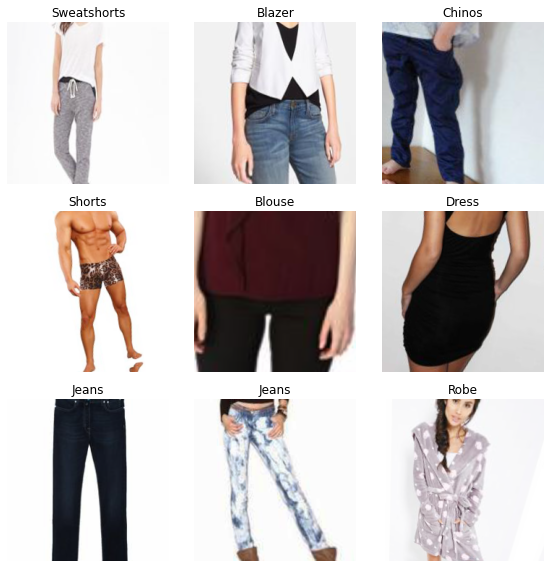

In [0]:
train_image_list = ImageList.from_df(df=data_df, path=root_path, cols='image_path').split_by_idxs(
    (data_df[data_df['dataset_type']=='train'].index),
    (data_df[data_df['dataset_type']=='val'].index)).label_from_df(cols='category')
test_image_list = ImageList.from_df(df=data_df[data_df['dataset_type'] == 'test'], path=root_path, cols='image_path')

data = train_image_list.transform(get_transforms(), size=224).databunch(bs=128).normalize(imagenet_stats)
data.add_test(test_image_list)
data.show_batch(rows=3, figsize=(8,8))

# Conduct Transfer Learning from ResNet

## Resnet18/50

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


epoch,train_loss,valid_loss,accuracy,top_k_accuracy,top_k_accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.20E-03
Min loss divided by 10: 1.00E-02


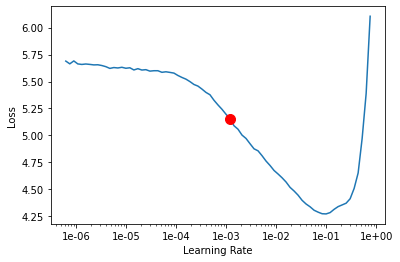

In [0]:
# see models available: https://docs.fast.ai/vision.models.html
# many options for Resnet, the numbers are the number of layers. 
# More layers are generally more accurate but take longer to train: resnet18, resnet34, resnet50, resnet101, resnet152
# get top 1 and top 5 accuracy
def train_model(data, pretrained_model, model_metrics):
    learner = cnn_learner(data, pretrained_model, metrics=model_metrics)
    learner.model = torch.nn.DataParallel(learner.model)
    learner.lr_find()
    learner.recorder.plot(suggestion=True)
    return learner

pretrained_model = models.resnet18 # simple model that can be trained on free tier
# pretrained_model = models.resnet50 # need pro tier, model I used

model_metrics = [accuracy, partial(top_k_accuracy, k=1), partial(top_k_accuracy, k=5)]
learner = train_model(data, pretrained_model, model_metrics)

In [0]:
learner.fit_one_cycle(10, max_lr=1e-02)

epoch,train_loss,valid_loss,accuracy,top_k_accuracy,top_k_accuracy,time
0,1.471898,1.353760,0.602250,0.602250,0.897625,16:54
1,1.451260,1.388633,0.593200,0.593200,0.891875,16:19
2,1.440240,1.380244,0.594750,0.594750,0.894000,16:32
3,1.409721,1.315045,0.610425,0.610425,0.905450,16:39
4,1.335867,1.257601,0.634525,0.634525,0.911550,16:36
5,1.315253,1.238566,0.639000,0.639000,0.915575,16:48
6,1.275752,1.166933,0.658325,0.658325,0.923950,17:06
7,1.228926,1.135368,0.664400,0.664400,0.926100,17:09


Buffered data was truncated after reaching the output size limit.

## Evaluate Model 

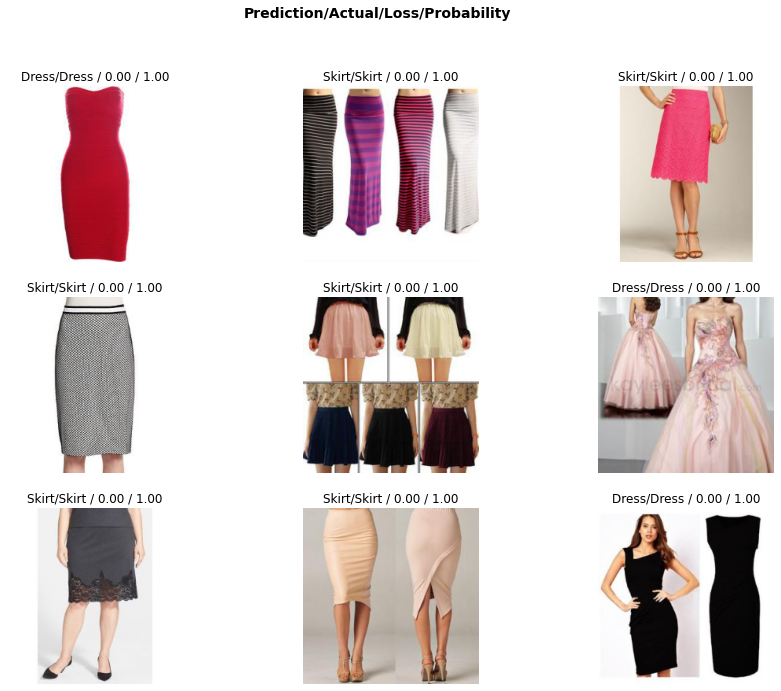

In [0]:
interp = ClassificationInterpretation.from_learner(learner)
interp.plot_top_losses(9, largest=False, figsize=(15,11), heatmap_thresh=5)

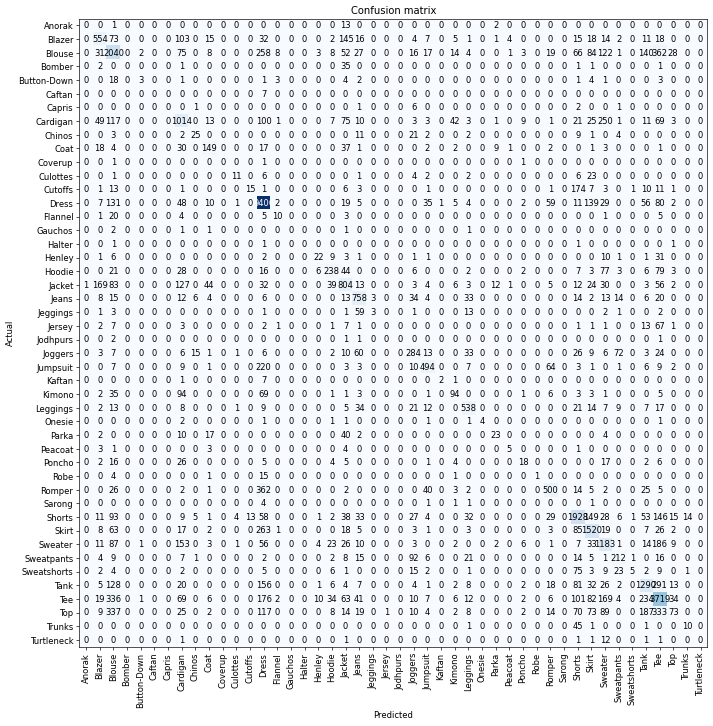

In [0]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [0]:
# saving the model (temporary, will lose model once environment resets)
learner.save('resnet-fashion')

In [0]:
# saving the model (permanent), need to enter authorization code
drive.mount('/content/gdrive')
learner.save('/content/gdrive/My Drive/resnet18-fashion')
# learner.save('/content/gdrive/My Drive/resnet50-fashion')

In [0]:
# view model details
learner.model.module

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

# Use Fastai hooks to retrieve image embeddings

In [0]:
class SaveFeatures():
    features=None
    def __init__(self, m): 
        self.hook = m.register_forward_hook(self.hook_fn)
        self.features = None
    def hook_fn(self, module, input, output): 
        out = output.detach().cpu().numpy()
        if isinstance(self.features, type(None)):
            self.features = out
        else:
            self.features = np.row_stack((self.features, out))
    def remove(self): 
        self.hook.remove()

In [0]:
# load the trained model
def load_learner(data, pretrained_model, model_metrics, model_path):
    learner = cnn_learner(data, pretrained_model, metrics=model_metrics)
    learner.model = torch.nn.DataParallel(learner.model)
    learner = learner.load(model_path)
    return learner

model_metrics = [accuracy, partial(top_k_accuracy, k=1), partial(top_k_accuracy, k=5)]
# if gdrive not mounted:
drive.mount('/content/gdrive') 

# pretrained_model = models.resnet18 # simple model that can be trained on free tier
# model_path = "/content/gdrive/My Drive/resnet18-fashion"

pretrained_model = models.resnet50 # need pro tier
model_path = "/content/gdrive/My Drive/resnet50-fashion"

learner = load_learner(data, pretrained_model, model_metrics, model_path)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


In [0]:
# takes time to populate the embeddings for each image
# Get 2nd last layer of the model that stores the embedding for the image representations
# the last linear layer is the output layer.
saved_features = SaveFeatures(learner.model.module[1][4])
_= learner.get_preds(data.train_ds)
_= learner.get_preds(DatasetType.Valid)

In [0]:
# prepare the data for generating recommendations (exlcude test data)
# get the embeddings from trained model
img_path = [str(x) for x in (list(data.train_ds.items) +list(data.valid_ds.items))]
label = [data.classes[x] for x in (list(data.train_ds.y.items) +list(data.valid_ds.y.items))]
label_id = [x for x in (list(data.train_ds.y.items) +list(data.valid_ds.y.items))]
data_df_ouput = pd.DataFrame({'img_path': img_path, 'label': label, 'label_id': label_id})
data_df_ouput['embeddings'] = np.array(saved_features.features).tolist()
data_df_ouput

,img_path,label,label_id,embeddings
0,./img/Sheer_Pleated-Front_Blouse/img_00000001.jpg,Blouse,2,"[81.00043487548828, 44.81427764892578, 113.260..."
1,./img/Sheer_Pleated-Front_Blouse/img_00000002.jpg,Blouse,2,"[80.07913208007812, -43.57665252685547, 40.843..."
2,./img/Sheer_Pleated-Front_Blouse/img_00000004.jpg,Blouse,2,"[-0.36386072635650635, 59.02427673339844, 58.7..."
3,./img/Sheer_Pleated-Front_Blouse/img_00000008.jpg,Blouse,2,"[57.18981170654297, 49.87873458862305, 148.890..."
4,./img/Sheer_Pleated-Front_Blouse/img_00000009.jpg,Blouse,2,"[19.539146423339844, 63.571590423583984, 82.27..."
...,...,...,...,...
249217,./img/Paisley_Print_Babydoll_Dress/img_0000003...,Dress,13,"[61.53594207763672, -0.285577654838562, 1.1974..."
249218,./img/Paisley_Print_Babydoll_Dress/img_0000004...,Dress,13,"[144.95947265625, 52.98737335205078, 95.157066..."
249219,./img/Paisley_Print_Babydoll_Dress/img_0000004...,Dress,13,"[203.9726104736328, -48.656028747558594, 173.4..."
249220,./img/Paisley_Print_Babydoll_Dress/img_0000004...,Dress,13,"[223.5382080078125, 29.812786102294922, 113.28..."


# Use Approximate Nearest Neighbors to obtain most similar images

In [0]:
# Using Spotify's Annoy
def get_similar_images_annoy(annoy_tree, img_index, number_of_items=12):
    start = time.time()
    img_id, img_label  = data_df_ouput.iloc[img_index, [0, 1]]
    # +1 since we drop first image
    similar_img_ids = annoy_tree.get_nns_by_item(img_index, number_of_items+1)
    end = time.time()
    print(f'{(end - start) * 1000} ms')
    # ignore first item as it is always target image
    return img_id, img_label, data_df_ouput.iloc[similar_img_ids[1:]] 


# for images similar to centroid 
def get_similar_images_annoy_centroid(annoy_tree, vector_value, number_of_items=12):
    start = time.time()
    # dontt need +1 since we not dropping first
    similar_img_ids = annoy_tree.get_nns_by_vector(vector_value, number_of_items)
    end = time.time()
    print(f'{(end - start) * 1000} ms')
    # dont ignore first item since we using psudeo vector object
    return data_df_ouput.iloc[similar_img_ids] 


def show_similar_images(similar_images_df, fig_size=[10,10], hide_labels=True):
    if hide_labels:
        category_list = []
        for i in range(len(similar_images_df)):
            # replace category with blank so it wont show in display
            category_list.append(CategoryList(similar_images_df['label_id'].values*0,
                                              [''] * len(similar_images_df)).get(i))
    else:
        category_list = [learner.data.train_ds.y.reconstruct(y) for y in similar_images_df['label_id']]
    return learner.data.show_xys([open_image(img_id) for img_id in similar_images_df['img_path']],
                                category_list, figsize=fig_size)

In [0]:
# more tree = better approximation
ntree = 100
#"angular", "euclidean", "manhattan", "hamming", or "dot"
metric_choice = 'angular'

annoy_tree = AnnoyIndex(len(data_df_ouput['embeddings'][0]), metric=metric_choice)

# # takes a while to build the tree
for i, vector in enumerate(data_df_ouput['embeddings']):
    annoy_tree.add_item(i, vector)
_  = annoy_tree.build(ntree)

## Embeddings Centroid Detection

In [0]:
def centroid_embedding(outfit_embedding_list):
    number_of_outfits = outfit_embedding_list.shape[0]
    length_of_embedding = outfit_embedding_list.shape[1]
    centroid = []
    for i in range(length_of_embedding):
        centroid.append(np.sum(outfit_embedding_list[:, i])/number_of_outfits)
    return centroid

In [0]:
def generate_image_mix(list_1, list_2, number_of_items=12, ratio=0.5):
    list_1_num_items = int(number_of_items * ratio)
    list_2_num_items = number_of_items - list_1_num_items
    list_1_temp = np.random.choice(list_1, list_1_num_items, replace=False)
    list_2_temp = np.random.choice(list_2, list_2_num_items, replace=False)
    return np.append(list_1_temp,list_2_temp)

def get_similar_image(outfit_img_ids):
    outfit_embedding_list = []
    for img_index in outfit_img_ids:
        outfit_embedding_list.append(data_df_ouput.iloc[img_index, 3])

    outfit_embedding_list = np.array(outfit_embedding_list)
    outfit_centroid_embedding = centroid_embedding(outfit_embedding_list)
    outfits_selected = data_df_ouput.iloc[outfit_img_ids] 

    similar_images_df = get_similar_images_annoy_centroid(annoy_tree, outfit_centroid_embedding, 30)
    show_similar_images(similar_images_df, fig_size=[15,15])

245412


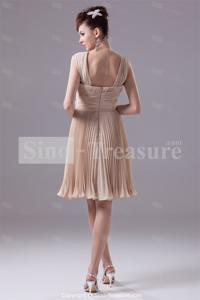

In [0]:
# image explorer 

# explore a specific type of clothes
# cloth_index = data_df_ouput[data_df_ouput.label=='Coat'].index
# img_index = np.random.choice(cloth_index, 1)[0]

img_index = np.random.randint(len(data_df_ouput),size=1)[0]

print(img_index)
open_image(data_df_ouput.iloc[img_index, 0])

In [0]:
# Selected Seasons Outfit - Spring, Summer, Autumn, Winter
spring_ids = [60676, 70282, 104154, 235539, 30541, 242857, 73647, 109420, 180461, 169567, 22788, 17442, 166013,
              244809, 13771, 174666, 210204, 246338, 243975, 56543,217299, 84747,164253, 194166]
summer_ids = [237651, 102444, 105986, 23610, 3307, 85789, 50391, 27079, 50438, 183651, 217142,230579,
              118421, 28488, 100845, 211697, 133667, 37422, 195827, 79475, 39237, 192176, 248130, 232170]
autumn_ids = [125328, 28806, 81763, 224471, 66524, 239079, 30221, 114039, 51277, 55470, 221654, 226016, 
              4627, 60861, 175997, 60040, 19313, 99686, 37807, 200329, 82795, 75392, 26517, 60452,
              49650, 120012, 60198, 84413, 34788]
winter_ids = [64161, 227306,165196, 240640, 165222, 240343, 206881, 147516, 248762, 165234,
              206341, 248774, 64297, 148709, 165253, 164704, 223365, 206586, 45383, 219502, 217111, 45191,
              84280, 80393, 85121]



In [0]:
print(len(spring_ids),len(summer_ids),len(autumn_ids),len(winter_ids))

24 24 29 25


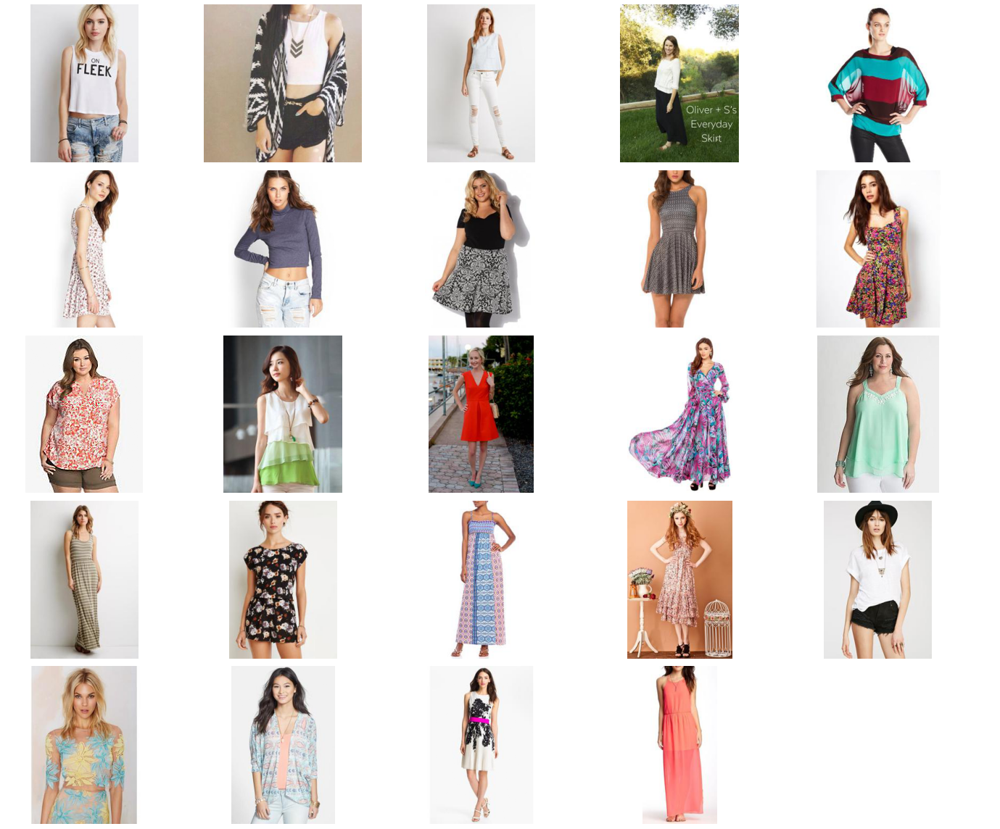

In [0]:
outfits_selected = data_df_ouput.iloc[spring_ids][0:24] 
show_similar_images(outfits_selected, fig_size=[20,16])

### Weather Data

In [0]:
url = 'https://drive.google.com/uc?id=12IseVEDhsw8Smm7BE3sOzCk1QPF9oQ7g'
output = 'weather_major_cities.csv'
gdown.download(url, output, quiet=False)
weather = pd.read_csv('weather_major_cities.csv')

Downloading...
From: https://drive.google.com/uc?id=12IseVEDhsw8Smm7BE3sOzCk1QPF9oQ7g
To: /content/weather_major_cities.csv
14.1MB [00:00, 67.0MB/s]


In [0]:
weather.head()

,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
0,1849-01-01,26.704,1.435,Abidjan,Côte D'Ivoire,5.63N,3.23W
1,1849-02-01,27.434,1.362,Abidjan,Côte D'Ivoire,5.63N,3.23W
2,1849-03-01,28.101,1.612,Abidjan,Côte D'Ivoire,5.63N,3.23W
3,1849-04-01,26.140,1.387,Abidjan,Côte D'Ivoire,5.63N,3.23W
4,1849-05-01,25.427,1.200,Abidjan,Côte D'Ivoire,5.63N,3.23W


#### Madrid

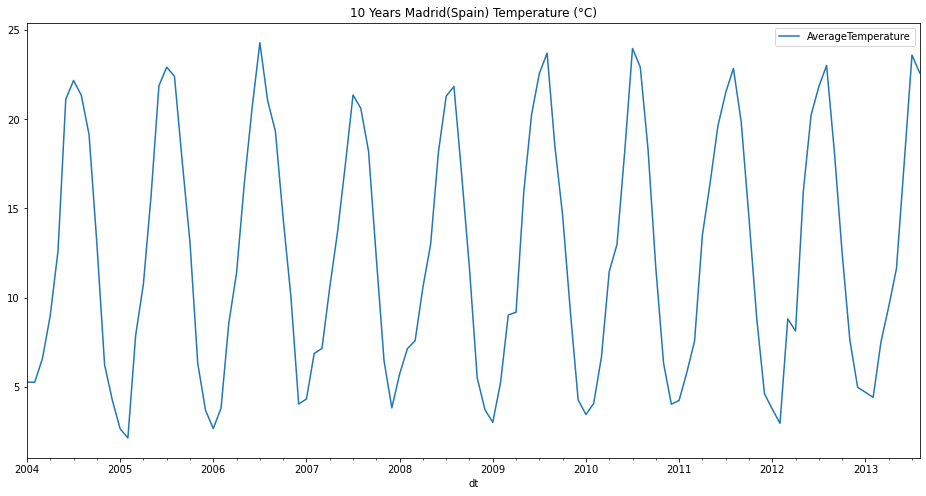

In [0]:
weather_madrid = weather.loc[(weather.City=='Madrid') & (weather.dt>='2004-01-01'),['dt','AverageTemperature']].dropna()
weather_madrid['dt'] = pd.to_datetime(weather_madrid['dt'], format="%Y-%m-%d")
weather_madrid.set_index('dt', inplace=True)
weather_madrid.plot(figsize=(16,8), title='10 Years Madrid(Spain) Temperature (°C)')
# weather_madrid

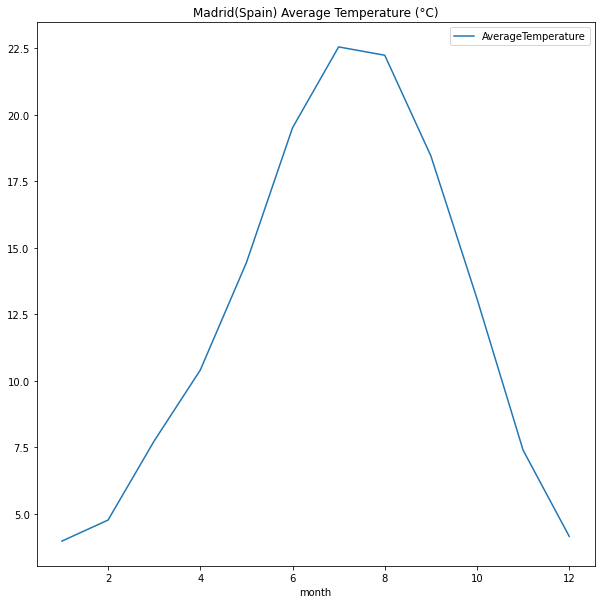

In [0]:
weather_madrid['month'] = weather_madrid.index.month
weather_madrid.groupby('month').mean().plot(figsize=(10,10), title='Madrid(Spain) Average Temperature (°C)')

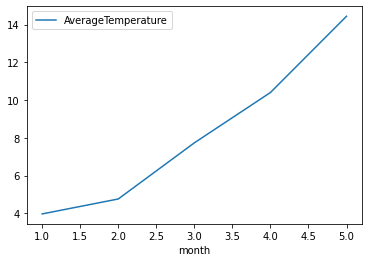

In [0]:
# get temperature from jan to may, seems to increase linearly
weather_madrid[(weather_madrid.month<=5)].groupby('month').mean().plot()

#### Melbourne

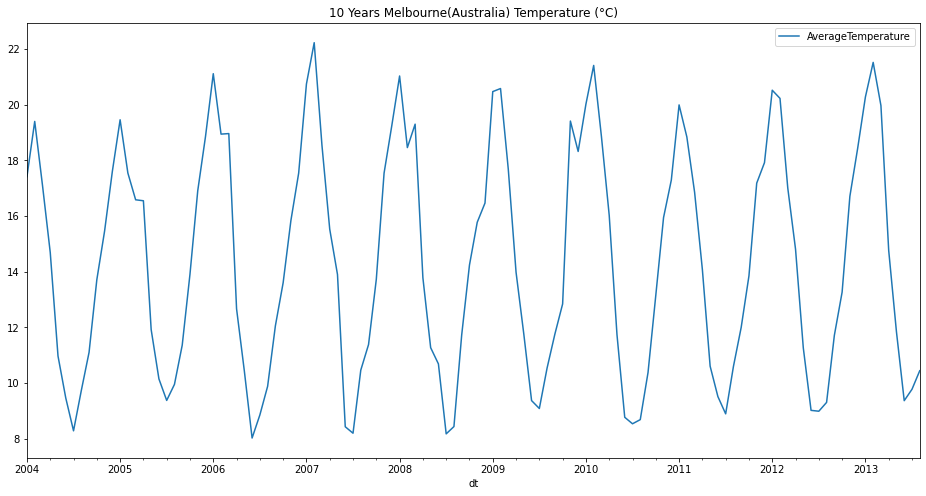

In [0]:
weather_melbourne = weather.loc[(weather.City=='Melbourne') & (weather.dt>='2004-01-01'),['dt','AverageTemperature']].dropna()
weather_melbourne['dt'] = pd.to_datetime(weather_melbourne['dt'], format="%Y-%m-%d")
weather_melbourne.set_index('dt', inplace=True)
weather_melbourne.plot(figsize=(16,8), title='10 Years Melbourne(Australia) Temperature (°C)')
# weather_melbourne

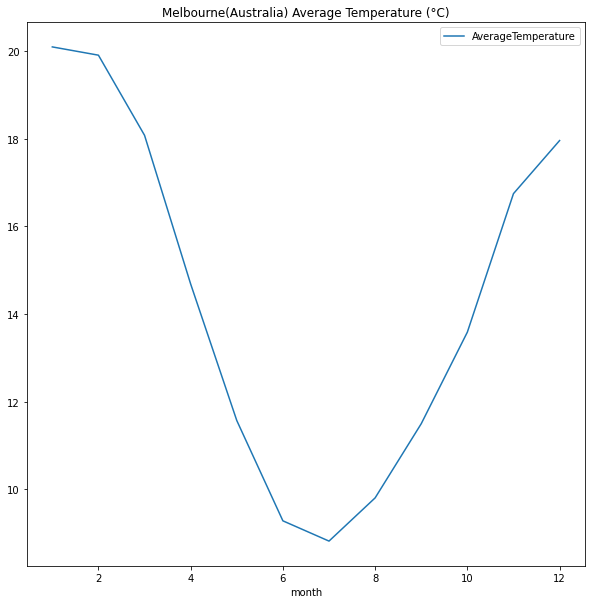

In [0]:
weather_melbourne['month'] = weather_melbourne.index.month
weather_melbourne.groupby('month').mean().plot(figsize=(10,10), title='Melbourne(Australia) Average Temperature (°C)')

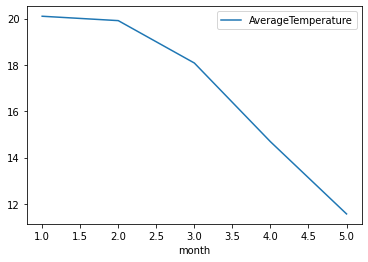

In [0]:
# get temperature from jan to may, seems to decrease linearly from Feb

weather_melbourne[(weather_melbourne.month<=5)].groupby('month').mean().plot()

### Generate Collections

#### Madrid

1.2264251708984375 ms


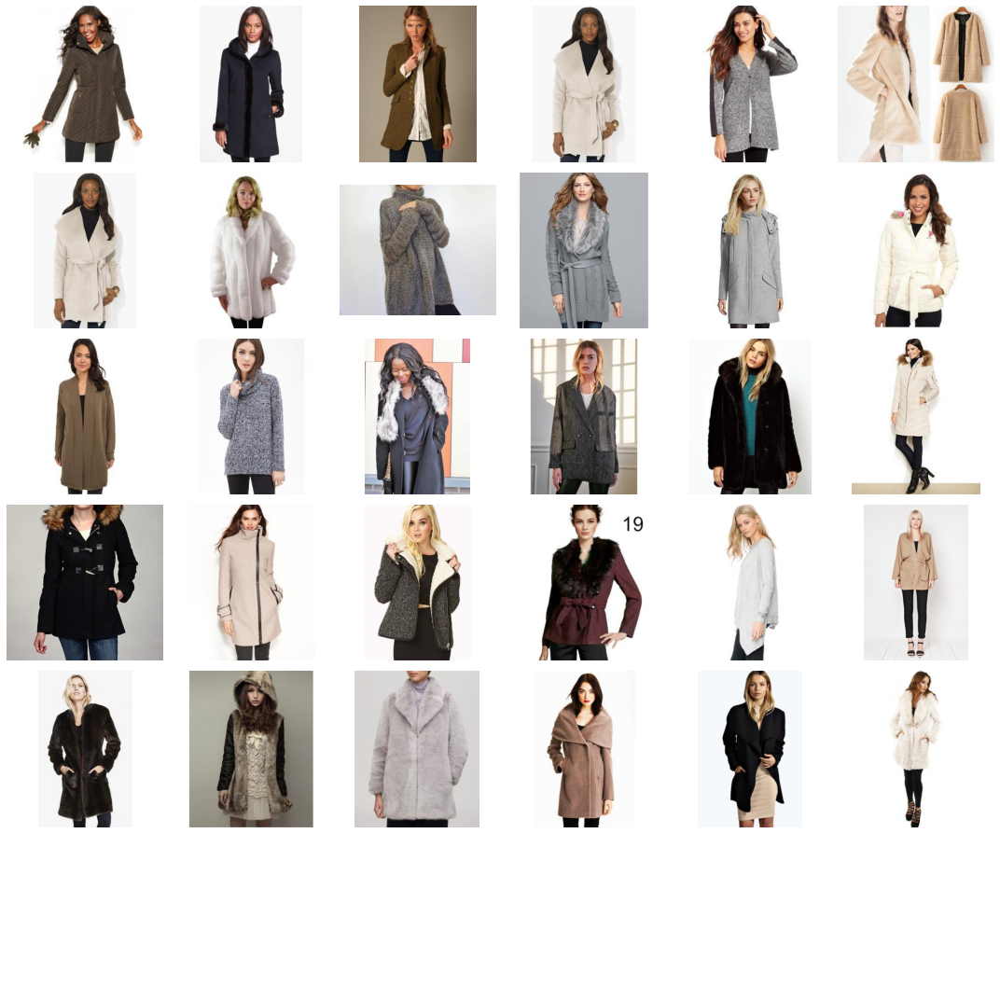

In [0]:
get_similar_image(generate_image_mix(winter_ids, spring_ids, number_of_items=24, ratio=1.0))

1.0120868682861328 ms


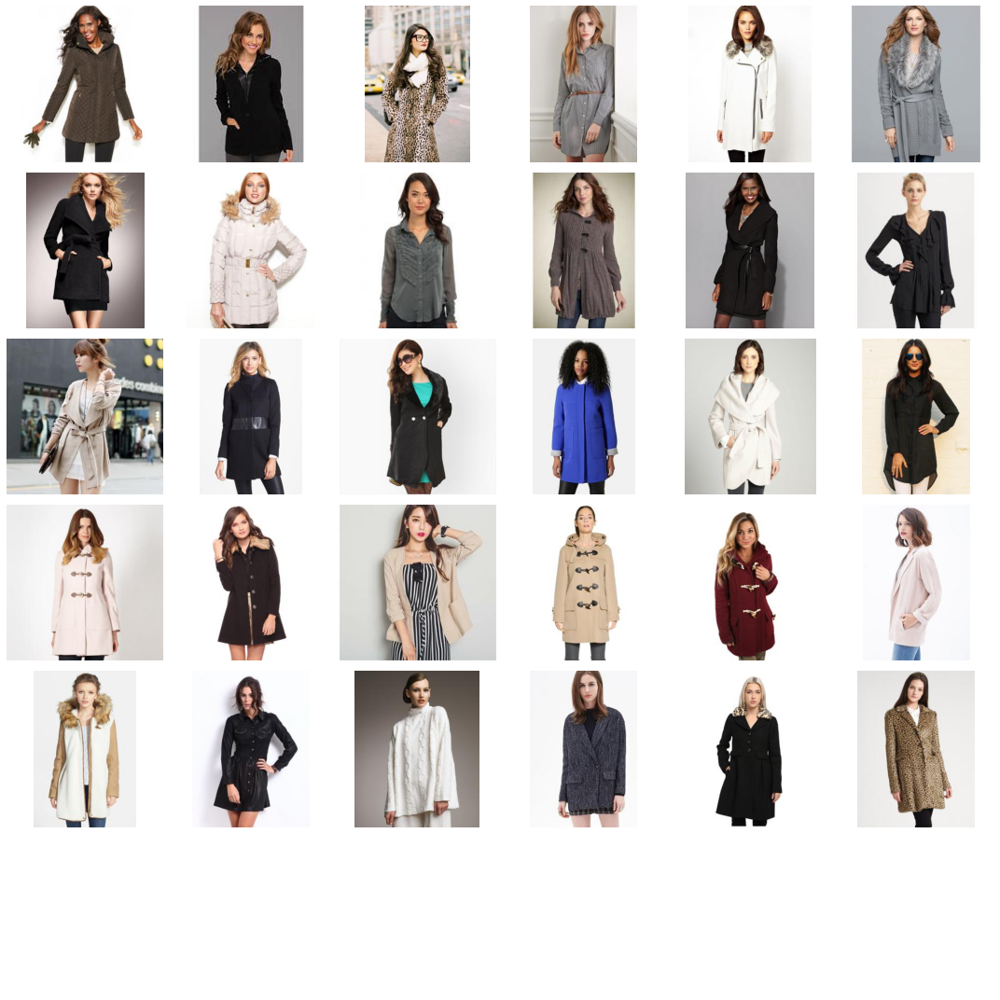

In [0]:
get_similar_image(generate_image_mix(winter_ids, spring_ids, number_of_items=24, ratio=0.75))

0.9911060333251953 ms


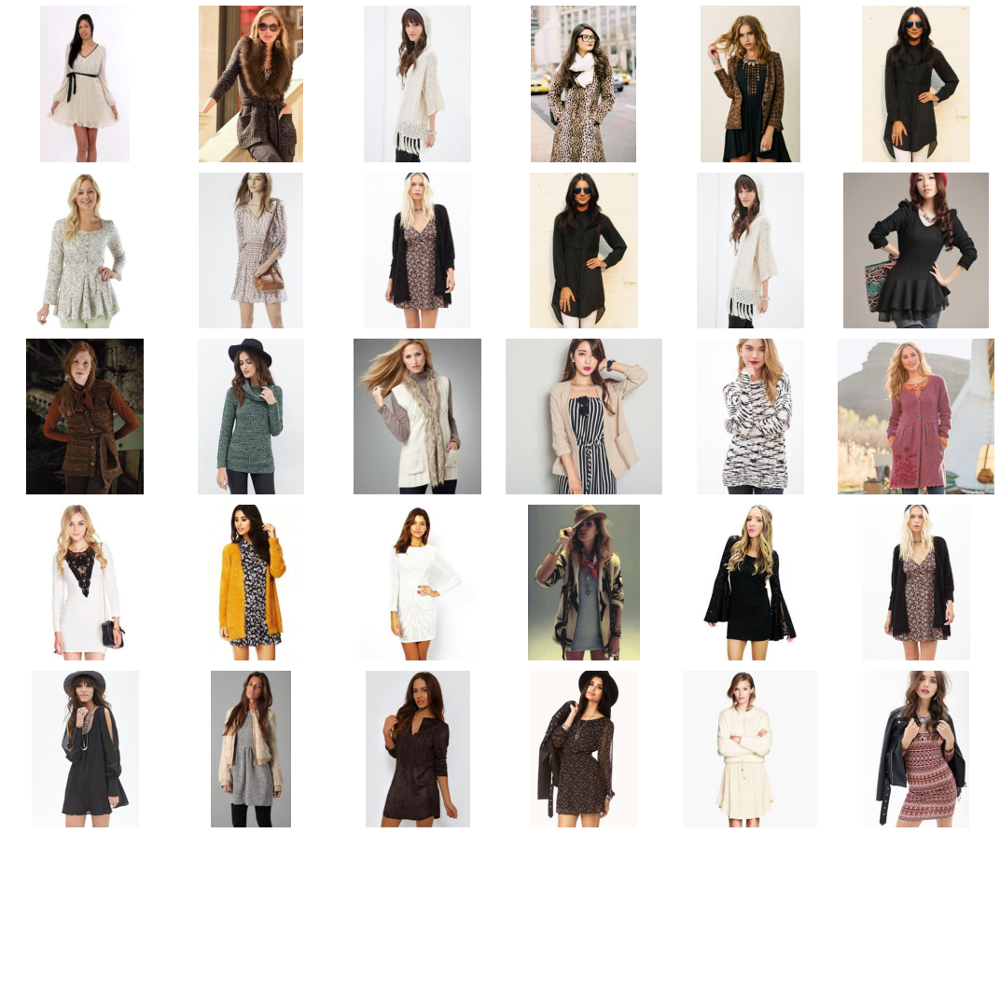

In [0]:
get_similar_image(generate_image_mix(winter_ids, spring_ids, number_of_items=24, ratio=0.5))

1.375436782836914 ms


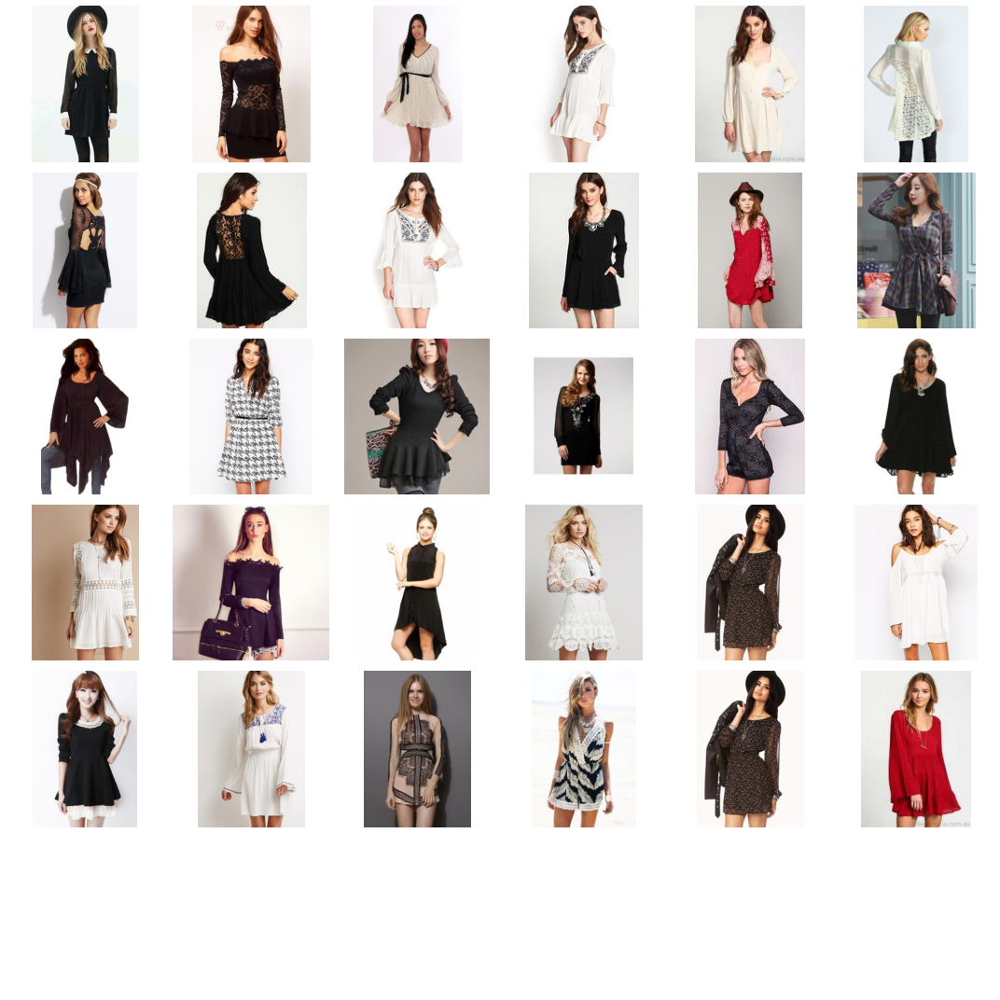

In [0]:
get_similar_image(generate_image_mix(winter_ids, spring_ids, number_of_items=24, ratio=0.25))

1.6467571258544922 ms


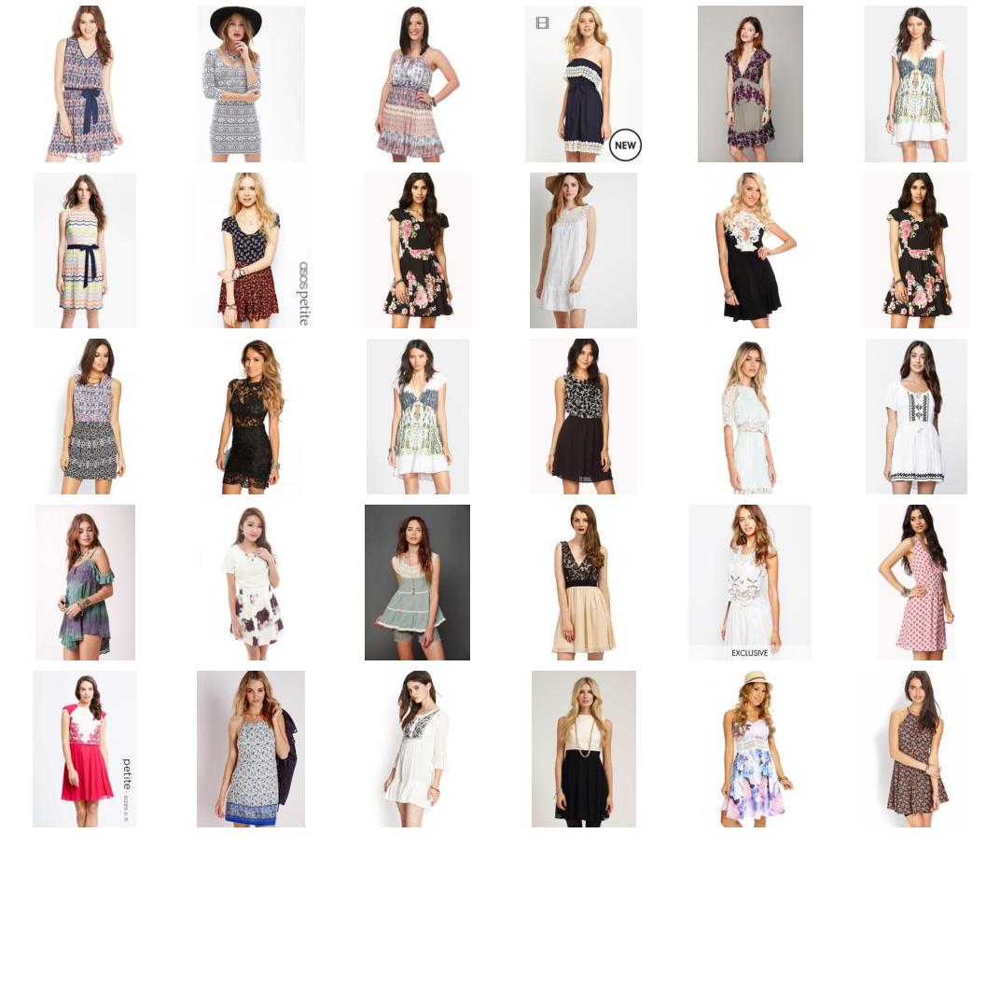

In [0]:
get_similar_image(generate_image_mix(winter_ids, spring_ids, number_of_items=24, ratio=0.0))

#### Melbourne

1.260519027709961 ms


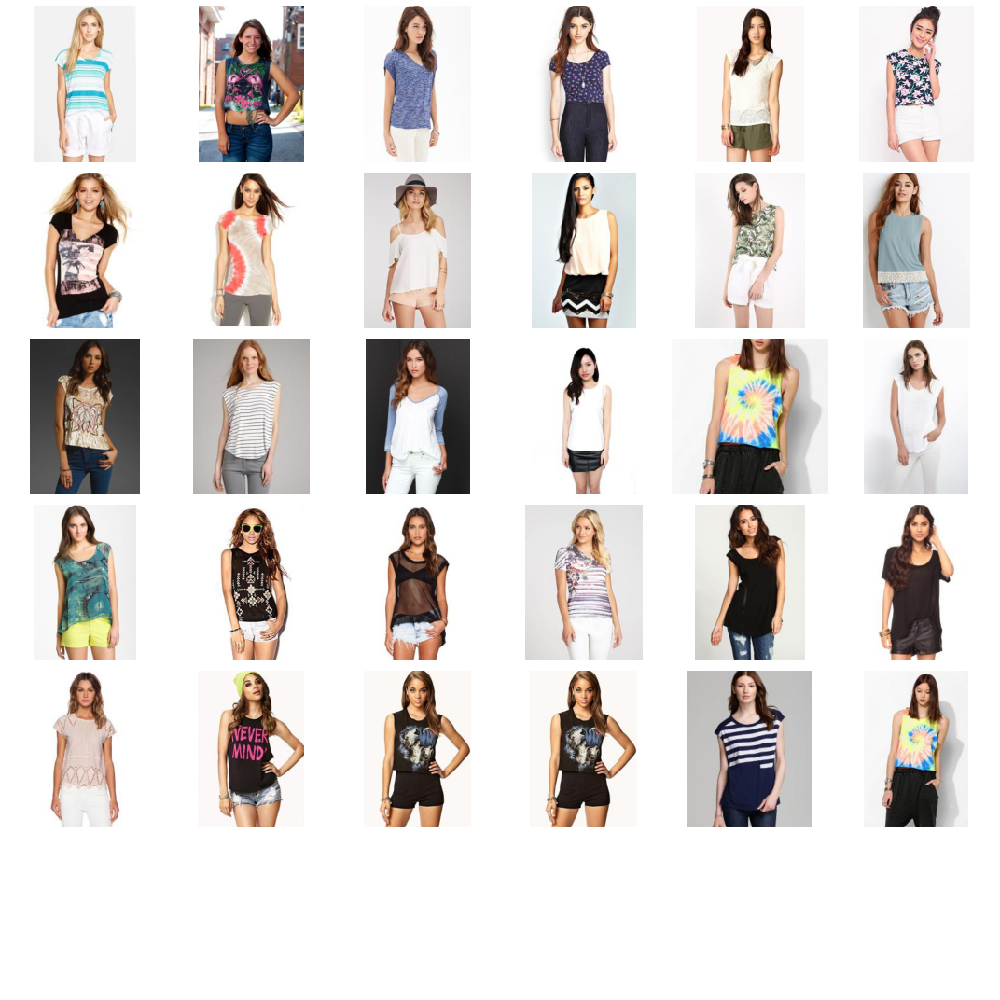

In [0]:
get_similar_image(generate_image_mix(summer_ids, autumn_ids, number_of_items=24, ratio=1.0))

1.4815330505371094 ms


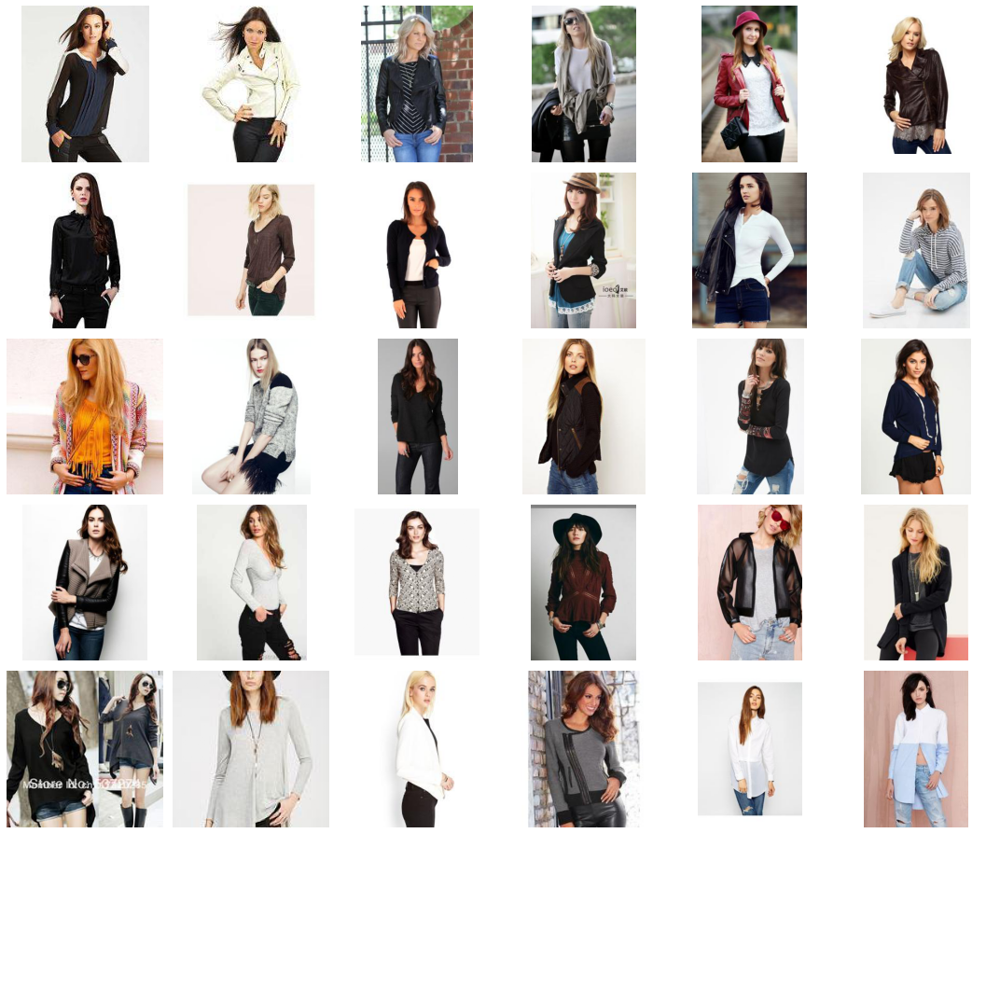

In [0]:
get_similar_image(generate_image_mix(summer_ids, autumn_ids, number_of_items=24, ratio=0.25))

1.5845298767089844 ms


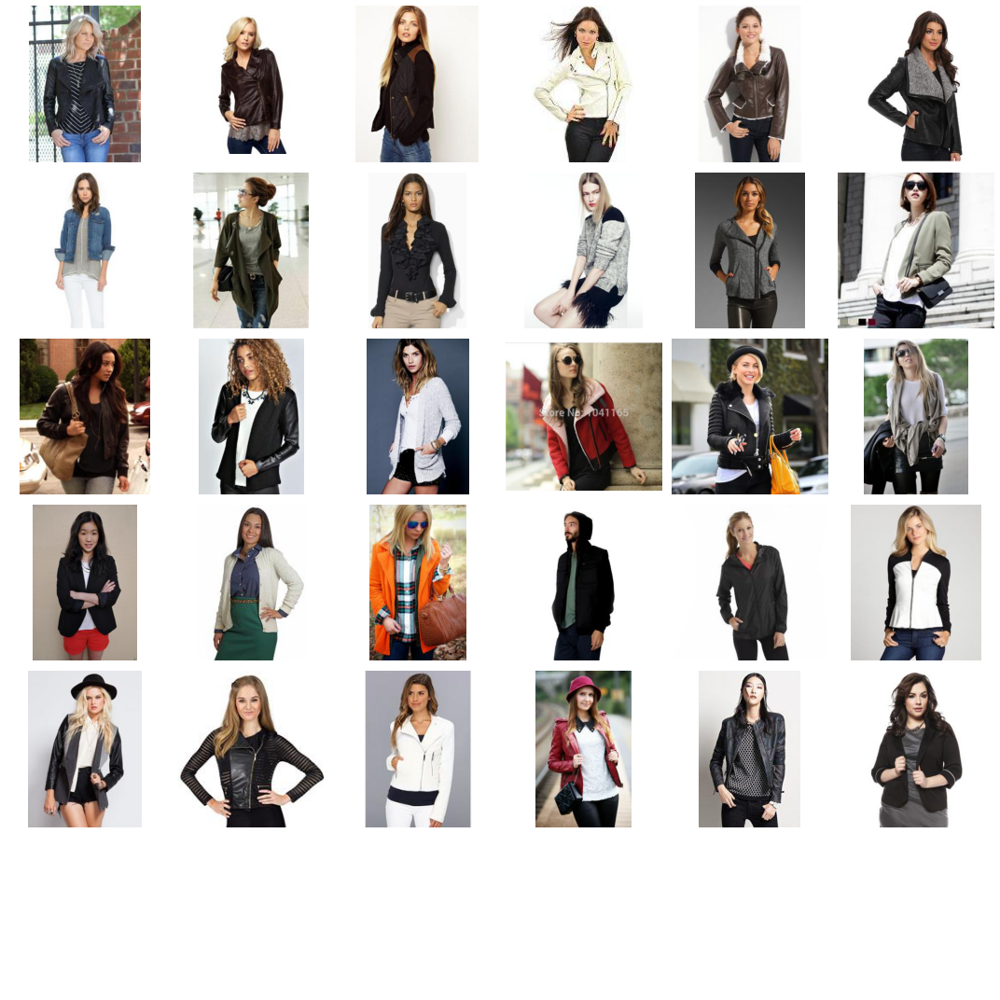

In [0]:
get_similar_image(generate_image_mix(summer_ids, autumn_ids, number_of_items=24, ratio=0.0))

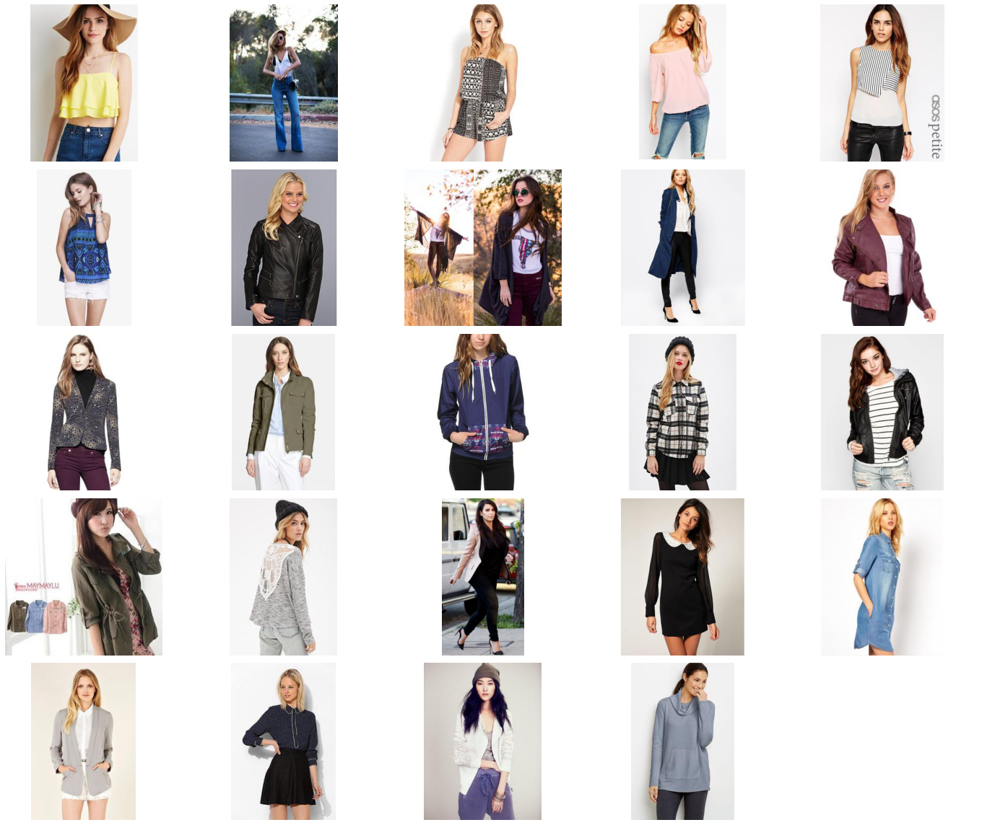

In [0]:
outfits_selected = data_df_ouput.iloc[generate_image_mix(summer_ids, autumn_ids, number_of_items=24, ratio=0.25)][0:24] 
show_similar_images(outfits_selected, fig_size=[20,16])

# Reflections

* Try to generate new collections based on different ratios. Are the results "good"? How can the recommendations be improved? 
* What other kinds of time-series data will you include in the model? How will it change the result? 

